### Requires the scenicplus conda environmental

In [1]:
import os
import mudata
import pickle
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import upsetplot
from scenicplus.RSS import (regulon_specificity_scores, plot_rss)
from collections import Counter
import anndata

In [2]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

In [3]:
%%time
cto_path = "pycistopic_outs/updated_cistopic_obj.pkl"
with open(cto_path, 'rb') as file:
    cto = pickle.load(file)

CPU times: user 660 ms, sys: 1.86 s, total: 2.52 s
Wall time: 2.92 s


In [4]:
Counter(cto.cell_data.updated_cell_type)

Counter({'Cardiomyocyte:N:postnatal': 750,
         'Cardiomyocyte:N:fetal': 750,
         'Cardiomyocyte:Y:postnatal': 750,
         'Endothelial:N:postnatal': 750,
         'Endothelial:N:fetal': 750,
         'Endothelial:Y:postnatal': 750,
         'Fibroblast:N:postnatal': 750,
         'Pericyte:N:postnatal': 750,
         'Fibroblast:N:fetal': 750,
         'Pericyte:N:fetal': 750,
         'Fibroblast:Y:postnatal': 750,
         'Pericyte:Y:postnatal': 750,
         'Myeloid:N:postnatal': 750,
         'Myeloid:N:fetal': 750,
         'Myeloid:Y:postnatal': 750,
         'Lymphoid:N:postnatal': 750,
         'Lymphoid:N:fetal': 750,
         'Lymphoid:Y:postnatal': 750})

In [5]:
%%time
adata = sc.read_h5ad("03_RNA_adata_for_scenicplus.h5ad")

CPU times: user 222 ms, sys: 539 ms, total: 760 ms
Wall time: 1.28 s


In [6]:
adata.obs.updated_cell_type

Fetal_LV_18wk_e1-run1n2:CCGCGTATTGGG       Endothelial:N:fetal
Fetal-Atria-18wk:TCCGTCCAACAC              Endothelial:N:fetal
Fetal-1st-LV-0315-1-run1n2:CGGAGATAACTG    Endothelial:N:fetal
Fetal_LV_18wk_e1-run1n2:TTGGGCCGGAAA       Endothelial:N:fetal
ENCFF849ALE:CGTGTTACAGTACCGT               Endothelial:N:fetal
                                                  ...         
TWCM-11-74:TTCGGTCGTTCGAATC                Myeloid:N:postnatal
P1516:TTGTGTTCAGTGACCC-1-10                Myeloid:N:postnatal
ENCSR762LML:GGTCCTGCATCAGCAC               Myeloid:N:postnatal
ND15755-LV-2nd-run1234:AACTCAGTGGTA        Myeloid:N:postnatal
P1549:TCCCATGTCATGAGTC-1-39                Myeloid:N:postnatal
Name: updated_cell_type, Length: 13500, dtype: category
Categories (18, object): ['Cardiomyocyte:N:fetal', 'Cardiomyocyte:N:postnatal', 'Cardiomyocyte:Y:postnatal', 'Endothelial:N:fetal', ..., 'Myeloid:Y:postnatal', 'Pericyte:N:fetal', 'Pericyte:N:postnatal', 'Pericyte:Y:postnatal']

In [7]:
%%time
scplus_mdata = mudata.read("scplus_pipeline/Snakemake/scplusmdata.h5mu")

/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/home/will

CPU times: user 2.8 s, sys: 1min 48s, total: 1min 50s
Wall time: 2min


In [8]:
scplus_mdata

MuData object with n_obs × n_vars = 27000 × 663717
  uns:	'direct_e_regulon_metadata', 'extended_e_regulon_metadata'
  6 modalities
    scRNA_counts:	27000 x 16115
      obs:	'updated_cell_type'
    scATAC_counts:	27000 x 646934
      obs:	'updated_cell_type'
      var:	'Chromosome', 'Start', 'End', 'Width', 'cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc', 'cisTopic_log_nr_acc'
    direct_gene_based_AUC:	27000 x 193
    direct_region_based_AUC:	27000 x 193
    extended_gene_based_AUC:	27000 x 141
    extended_region_based_AUC:	27000 x 141

In [9]:
scplus_mdata.mod['scRNA_counts'].obs

,updated_cell_type
Cardiomyocyte:N:fetal_0,Cardiomyocyte:N:fetal
Cardiomyocyte:N:fetal_1,Cardiomyocyte:N:fetal
Cardiomyocyte:N:fetal_2,Cardiomyocyte:N:fetal
Cardiomyocyte:N:fetal_3,Cardiomyocyte:N:fetal
Cardiomyocyte:N:fetal_4,Cardiomyocyte:N:fetal
...,...
Pericyte:Y:postnatal_1495,Pericyte:Y:postnatal
Pericyte:Y:postnatal_1496,Pericyte:Y:postnatal
Pericyte:Y:postnatal_1497,Pericyte:Y:postnatal
Pericyte:Y:postnatal_1498,Pericyte:Y:postnatal


In [10]:
Counter(scplus_mdata.mod['scRNA_counts'].obs.updated_cell_type)

Counter({'Cardiomyocyte:N:fetal': 1500,
         'Cardiomyocyte:N:postnatal': 1500,
         'Cardiomyocyte:Y:postnatal': 1500,
         'Endothelial:N:fetal': 1500,
         'Endothelial:N:postnatal': 1500,
         'Endothelial:Y:postnatal': 1500,
         'Fibroblast:N:fetal': 1500,
         'Fibroblast:N:postnatal': 1500,
         'Fibroblast:Y:postnatal': 1500,
         'Lymphoid:N:fetal': 1500,
         'Lymphoid:N:postnatal': 1500,
         'Lymphoid:Y:postnatal': 1500,
         'Myeloid:N:fetal': 1500,
         'Myeloid:N:postnatal': 1500,
         'Myeloid:Y:postnatal': 1500,
         'Pericyte:N:fetal': 1500,
         'Pericyte:N:postnatal': 1500,
         'Pericyte:Y:postnatal': 1500})

In [11]:
#scplus_mdata.mod['scRNA_counts'].obs.cell_type = scplus_mdata.mod['scRNA_counts'].obs.index.str.rsplit('_', n=1).str[0]

In [12]:
#scplus_mdata.mod['scRNA_counts'].obs['cell_type_age'] = scplus_mdata.mod['scRNA_counts'].obs.index.str.rsplit('_', 1).str[0]

Direct and extended predicted TF-to-region-to-gene links. This dataframe contains also a ranking of each TF-region-gene triplet, based on its importance triplet_rank.

In [13]:
scplus_mdata.uns["direct_e_regulon_metadata"]

,Region,Gene,importance_R2G,rho_R2G,importance_x_rho,importance_x_abs_rho,TF,is_extended,eRegulon_name,Gene_signature_name,Region_signature_name,importance_TF2G,regulation,rho_TF2G,triplet_rank
0,chr10:73054953-73055454,FAM149B1,0.012615,0.140250,0.001769,0.001769,ADNP,False,ADNP_direct_+/+,ADNP_direct_+/+_(17g),ADNP_direct_+/+_(18r),0.828638,1,0.054381,18066
1,chr15:58791300-58791801,RNF111,0.028285,0.175035,0.004951,0.004951,ADNP,False,ADNP_direct_+/+,ADNP_direct_+/+_(17g),ADNP_direct_+/+_(18r),0.460608,1,0.066246,22769
2,chr3:136739153-136739654,STAG1,0.010926,0.055673,0.000608,0.000608,ADNP,False,ADNP_direct_+/+,ADNP_direct_+/+_(17g),ADNP_direct_+/+_(18r),0.575467,1,0.089717,22703
3,chr10:32041476-32041977,ARHGAP12,0.011591,0.070589,0.000818,0.000818,ADNP,False,ADNP_direct_+/+,ADNP_direct_+/+_(17g),ADNP_direct_+/+_(18r),0.433907,1,0.067101,26084
4,chr1:88866346-88866847,PKN2,0.051283,0.120226,0.006166,0.006166,ADNP,False,ADNP_direct_+/+,ADNP_direct_+/+_(17g),ADNP_direct_+/+_(18r),1.014109,1,0.080840,13394
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27394,chr19:49553940-49554441,RPL13A,0.009548,-0.079578,-0.000760,0.000760,ZBTB16,False,ZBTB16_direct_-/-,ZBTB16_direct_-/-_(15g),ZBTB16_direct_-/-_(16r),5.443362,-1,-0.205105,5294
27395,chr16:97380-97881,HBA1,0.013965,-0.066196,-0.000924,0.000924,ZBTB16,False,ZBTB16_direct_-/-,ZBTB16_direct_-/-_(15g),ZBTB16_direct_-/-_(16r),1.740879,-1,-0.122113,11963
27396,chr19:49461646-49462147,RPS11,0.002103,-0.062643,-0.000132,0.000132,ZBTB16,False,ZBTB16_direct_-/-,ZBTB16_direct_-/-_(15g),ZBTB16_direct_-/-_(16r),5.092862,-1,-0.171711,5864
27397,chr6:35522743-35523244,RPL10A,0.007489,-0.065215,-0.000488,0.000488,ZBTB16,False,ZBTB16_direct_-/-,ZBTB16_direct_-/-_(15g),ZBTB16_direct_-/-_(16r),3.429510,-1,-0.144580,10486


In [14]:
direct_regulons = scplus_mdata.uns["direct_e_regulon_metadata"]

In [15]:
direct_regulons = scplus_mdata.uns["direct_e_regulon_metadata"].sort_values(by = "triplet_rank")
direct_regulons

,Region,Gene,importance_R2G,rho_R2G,importance_x_rho,importance_x_abs_rho,TF,is_extended,eRegulon_name,Gene_signature_name,Region_signature_name,importance_TF2G,regulation,rho_TF2G,triplet_rank
11842,chr6:56555311-56555812,DST,0.122007,0.394807,0.048169,0.048169,MEIS2,False,MEIS2_direct_+/+,MEIS2_direct_+/+_(121g),MEIS2_direct_+/+_(140r),7.094421,1,0.294117,0
1609,chr10:94545512-94546013,HELLS,0.168279,0.151243,0.025451,0.025451,E2F1,False,E2F1_direct_+/+,E2F1_direct_+/+_(27g),E2F1_direct_+/+_(57r),1.452035,1,0.131914,1
8587,chr10:19815953-19816454,PLXDC2,0.145726,0.468607,0.068288,0.068288,FLI1,False,FLI1_direct_+/+,FLI1_direct_+/+_(389g),FLI1_direct_+/+_(1898r),5.697750,1,0.217382,2
2805,chr8:25922882-25923383,EBF2,0.058900,0.653548,0.038494,0.038494,EBF2,False,EBF2_direct_+/+,EBF2_direct_+/+_(258g),EBF2_direct_+/+_(532r),43.331950,1,1.000000,3
5015,chr7:122802129-122802630,CADPS2,0.116453,0.370728,0.043172,0.043172,ERG,False,ERG_direct_+/+,ERG_direct_+/+_(366g),ERG_direct_+/+_(1332r),5.647128,1,0.307433,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25039,chr10:114413360-114413861,ABLIM1,0.000048,0.319807,0.000015,0.000015,BNC2,False,BNC2_direct_-/+,BNC2_direct_-/+_(71g),BNC2_direct_-/+_(213r),0.464037,-1,-0.114727,27394
26033,chr11:19889322-19889823,NAV2,0.000043,0.306031,0.000013,0.000013,NR2F2,False,NR2F2_direct_-/+,NR2F2_direct_-/+_(10g),NR2F2_direct_-/+_(37r),0.269512,-1,-0.136844,27395
25865,chr3:69058376-69058877,FRMD4B,0.002481,0.136104,0.000338,0.000338,KLF12,False,KLF12_direct_-/+,KLF12_direct_-/+_(12g),KLF12_direct_-/+_(20r),0.155932,-1,-0.139949,27396
25064,chr4:168630706-168631207,PALLD,0.000027,0.425972,0.000012,0.000012,BNC2,False,BNC2_direct_-/+,BNC2_direct_-/+_(71g),BNC2_direct_-/+_(213r),0.522856,-1,-0.060307,27397


In [16]:
direct_regulons.to_csv("04_SCENICplus_direct_regulons.csv")

In [17]:
extended_regulons = scplus_mdata.uns["extended_e_regulon_metadata"]
extended_regulons

,Region,Gene,importance_R2G,rho_R2G,importance_x_rho,importance_x_abs_rho,TF,is_extended,eRegulon_name,Gene_signature_name,Region_signature_name,importance_TF2G,regulation,rho_TF2G,triplet_rank
0,chr19:1672239-1672740,UQCR11,0.082847,0.055846,0.004627,0.004627,ACAA1,True,ACAA1_extended_+/+,ACAA1_extended_+/+_(47g),ACAA1_extended_+/+_(75r),1.194363,1,0.059310,2919
1,chr14:102086943-102087444,HSP90AA1,0.040006,0.052894,0.002116,0.002116,ACAA1,True,ACAA1_extended_+/+,ACAA1_extended_+/+_(47g),ACAA1_extended_+/+_(75r),0.845638,1,0.074800,4501
2,chr8:144526879-144527380,GPT,0.035839,0.105728,0.003789,0.003789,ACAA1,True,ACAA1_extended_+/+,ACAA1_extended_+/+_(47g),ACAA1_extended_+/+_(75r),0.488170,1,0.067459,13651
3,chr14:22980566-22981067,PSMB5,0.047185,0.086213,0.004068,0.004068,ACAA1,True,ACAA1_extended_+/+,ACAA1_extended_+/+_(47g),ACAA1_extended_+/+_(75r),0.762257,1,0.058071,9412
4,chr16:31427447-31427948,COX6A2,0.057802,0.158178,0.009143,0.009143,ACAA1,True,ACAA1_extended_+/+,ACAA1_extended_+/+_(47g),ACAA1_extended_+/+_(75r),0.500504,1,0.072237,6002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16767,chr6:137261287-137261788,IFNGR1,0.004219,-0.061734,-0.000260,0.000260,SOX5,True,SOX5_extended_-/-,SOX5_extended_-/-_(14g),SOX5_extended_-/-_(16r),0.576906,-1,-0.077884,13111
16768,chr4:2256784-2257285,ZFYVE28,0.005287,-0.051311,-0.000271,0.000271,SOX5,True,SOX5_extended_-/-,SOX5_extended_-/-_(14g),SOX5_extended_-/-_(16r),0.815986,-1,-0.094189,14057
16769,chr20:48682634-48683135,PREX1,0.006859,-0.119560,-0.000820,0.000820,SOX5,True,SOX5_extended_-/-,SOX5_extended_-/-_(14g),SOX5_extended_-/-_(16r),0.481699,-1,-0.161975,15679
16770,chr8:2254039-2254540,MYOM2,0.000771,-0.174084,-0.000134,0.000134,SOX5,True,SOX5_extended_-/-,SOX5_extended_-/-_(14g),SOX5_extended_-/-_(16r),1.603657,-1,-0.089115,12073


In [18]:
extended_regulons.to_csv("04_SCENICplus_extended_regulons.csv")

### Downstream analysis

#### eRegulon dimensionality reduction

The eRegulon enrichment scores can be used to perform dimensionality reductions

#### AUC calculations

In [19]:
eRegulon_gene_AUC = anndata.concat(
    [scplus_mdata["direct_gene_based_AUC"], scplus_mdata["extended_gene_based_AUC"]],
    axis = 1,
)

In [20]:
eRegulon_gene_AUC.obs = scplus_mdata.obs.loc[eRegulon_gene_AUC.obs_names]
#eRegulon_gene_AUC.obs = scplus_mdata.mod['scRNA_counts'].obs

In [21]:
eRegulon_gene_AUC.obs['updated_cell_type'] = eRegulon_gene_AUC.obs.index.str.rsplit('_', n=1).str[0]

In [22]:
Counter(eRegulon_gene_AUC.obs['updated_cell_type'])

Counter({'Cardiomyocyte:N:fetal': 1500,
         'Cardiomyocyte:N:postnatal': 1500,
         'Cardiomyocyte:Y:postnatal': 1500,
         'Endothelial:N:fetal': 1500,
         'Endothelial:N:postnatal': 1500,
         'Endothelial:Y:postnatal': 1500,
         'Fibroblast:N:fetal': 1500,
         'Fibroblast:N:postnatal': 1500,
         'Fibroblast:Y:postnatal': 1500,
         'Lymphoid:N:fetal': 1500,
         'Lymphoid:N:postnatal': 1500,
         'Lymphoid:Y:postnatal': 1500,
         'Myeloid:N:fetal': 1500,
         'Myeloid:N:postnatal': 1500,
         'Myeloid:Y:postnatal': 1500,
         'Pericyte:N:fetal': 1500,
         'Pericyte:N:postnatal': 1500,
         'Pericyte:Y:postnatal': 1500})

In [23]:
sc.pp.neighbors(eRegulon_gene_AUC, use_rep = "X")

In [24]:
%%time
sc.tl.umap(eRegulon_gene_AUC)

CPU times: user 27 s, sys: 59.1 s, total: 1min 26s
Wall time: 14.7 s


/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


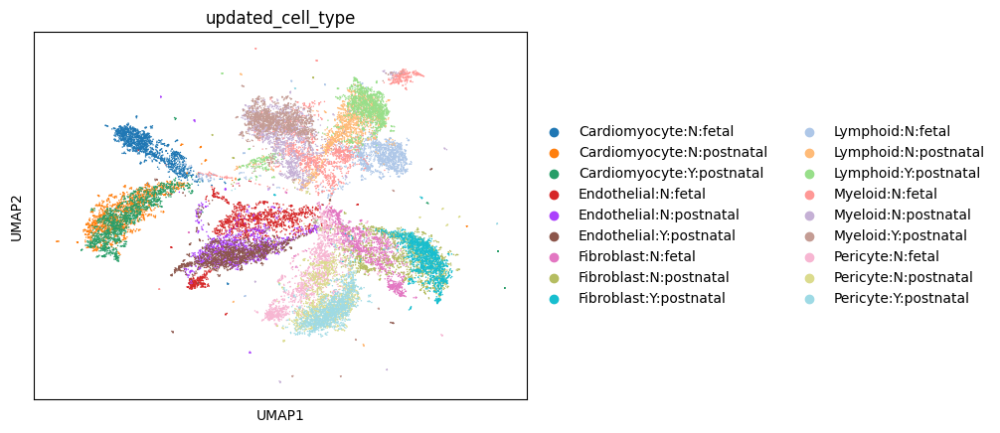

/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


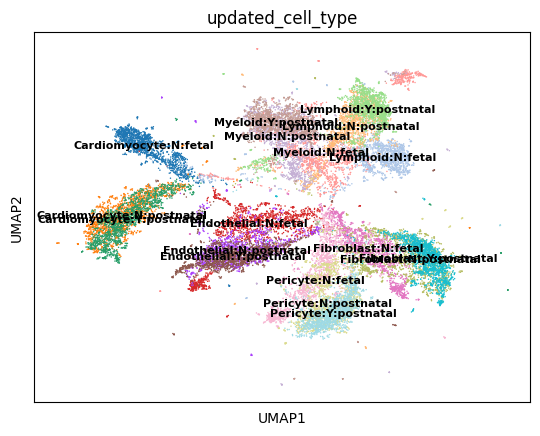

In [25]:
sc.pl.umap(eRegulon_gene_AUC, color = "updated_cell_type")
sc.pl.umap(eRegulon_gene_AUC, color = "updated_cell_type", legend_loc = "on data", legend_fontsize=8)

### eRegulon specificity score

In [26]:
rss = regulon_specificity_scores(
    scplus_mudata = scplus_mdata,
    variable = "scRNA_counts:updated_cell_type",
    modalities = ["direct_gene_based_AUC", "extended_gene_based_AUC"]
)

In [27]:
rss

,ADNP_direct_+/+_(17g),ARID3A_direct_+/+_(137g),AR_direct_+/+_(143g),ATF2_direct_+/-_(18g),BACH1_direct_+/+_(239g),BACH1_direct_+/-_(97g),BACH2_direct_+/-_(28g),BCL11A_direct_+/+_(128g),BCL11A_direct_+/-_(245g),BCL11A_direct_-/+_(30g),...,STAT4_extended_-/+_(17g),TBX20_extended_+/+_(207g),TCF12_extended_+/+_(88g),TCF21_extended_+/+_(21g),TCF4_extended_+/+_(49g),TCF4_extended_+/-_(56g),TCF4_extended_-/+_(78g),TWIST2_extended_+/+_(13g),ZBTB43_extended_+/-_(70g),ZNF423_extended_+/+_(15g)
Cardiomyocyte:N:fetal,0.243672,0.212961,0.238098,0.239447,0.234400,0.239815,0.218976,0.355232,0.350309,0.178431,...,0.233299,0.338543,0.232440,0.183802,0.219674,0.221706,0.336288,0.171458,0.291761,0.201648
Cardiomyocyte:N:postnatal,0.221575,0.201470,0.370761,0.221260,0.231933,0.234304,0.217833,0.336708,0.326318,0.181965,...,0.226905,0.316935,0.227107,0.177191,0.212662,0.207157,0.355314,0.172003,0.345924,0.184203
Cardiomyocyte:Y:postnatal,0.224743,0.202423,0.370657,0.223377,0.232573,0.235248,0.223294,0.335605,0.324896,0.182758,...,0.229325,0.315898,0.228052,0.179031,0.215278,0.206927,0.353900,0.173813,0.348197,0.185765
Endothelial:N:fetal,0.231294,0.221744,0.195018,0.236641,0.230462,0.228258,0.247132,0.206025,0.210276,0.251934,...,0.273523,0.215843,0.233713,0.200555,0.268270,0.269885,0.199022,0.190195,0.202790,0.273990
Endothelial:N:postnatal,0.227904,0.219609,0.200577,0.233838,0.231731,0.230868,0.211260,0.204986,0.204950,0.251970,...,0.272125,0.206408,0.235190,0.190974,0.275772,0.266792,0.198712,0.192042,0.206875,0.252832
Endothelial:Y:postnatal,0.235608,0.224171,0.196730,0.236822,0.233474,0.232758,0.211602,0.201958,0.202047,0.253287,...,0.276937,0.205148,0.238256,0.187900,0.282825,0.273472,0.195128,0.193425,0.205761,0.257745
Fibroblast:N:fetal,0.230147,0.214347,0.217361,0.225958,0.223598,0.220919,0.247937,0.207943,0.212490,0.255115,...,0.228596,0.232655,0.231184,0.372387,0.250063,0.243627,0.208692,0.255875,0.204284,0.258020
Fibroblast:N:postnatal,0.225761,0.214289,0.226622,0.227918,0.224581,0.219954,0.229154,0.203557,0.204997,0.286761,...,0.228739,0.227960,0.238069,0.326412,0.263697,0.257889,0.206282,0.387202,0.210176,0.259897
Fibroblast:Y:postnatal,0.236602,0.217727,0.219217,0.235460,0.231614,0.227886,0.223149,0.202706,0.202894,0.289107,...,0.236229,0.229397,0.248053,0.331951,0.271990,0.265325,0.203988,0.392632,0.201327,0.272920
Lymphoid:N:fetal,0.237093,0.229203,0.203228,0.223378,0.233243,0.234356,0.314887,0.214902,0.222111,0.190194,...,0.201558,0.202773,0.225897,0.187936,0.187465,0.196380,0.199741,0.182375,0.209014,0.195628


#### Obtain the AUC and save as df

In [28]:
eRegulon_gene_AUC_df = pd.DataFrame(eRegulon_gene_AUC.X)
eRegulon_gene_AUC_df.index = eRegulon_gene_AUC.obs_names
eRegulon_gene_AUC_df.columns = eRegulon_gene_AUC.var_names

### Produce plot of the each cell-type (disease + age group)

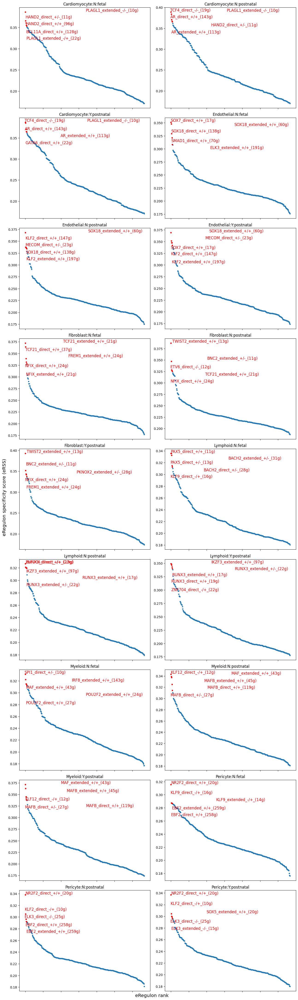

In [29]:
plot_rss(
    data_matrix = rss,
    top_n = 5,
    num_columns = 2
)

### Plot eRegulon enrichment scores

eRegulon enrichment scores can be plotted on the UMAP.

In [30]:
def identify_most_differential_TFs_by_disease(AUC_df, cell_type, eps=0.01): 

    '''For the activity scores, obtain a ratio of the fetal vs ND, D vs D, and fetal vs. D activity scores'''
    
    # add a small value to prevent infinity
    AUC_df = AUC_df + eps
    
    cell_type_ND = AUC_df[ AUC_df.index.str.startswith(cell_type + ":N:fetal") ].transpose().iloc[:, 0]
    cell_type_fetal = AUC_df[ AUC_df.index.str.startswith(cell_type + ":N:postnatal") ].transpose().iloc[:, 0]
    cell_type_D = AUC_df[ AUC_df.index.str.startswith(cell_type + ":Y:postnatal") ].transpose().iloc[:, 0]
    
    # calculate fold changes of it non-empty
    fold_change_fetal_v_ND = (cell_type_fetal / cell_type_ND).dropna().sort_values()
    fold_change_D_v_ND = (cell_type_D / cell_type_ND).dropna().sort_values()
    fold_change_fetal_v_D = (cell_type_fetal / cell_type_D).dropna().sort_values()

    # save as df
    fold_change_fetal_v_ND = pd.DataFrame(fold_change_fetal_v_ND).rename(columns = {0: "FC"})
    fold_change_fetal_v_ND['contrast'] = "fetal/ND"
    fold_change_D_v_ND = pd.DataFrame(fold_change_D_v_ND).rename(columns = {0: "FC"})
    fold_change_D_v_ND['contrast'] = "D/ND"
    fold_change_fetal_v_D = pd.DataFrame(fold_change_fetal_v_D).rename(columns = {0: "FC"})
    fold_change_fetal_v_D['contrast'] = "fetal/D"
    
    return [fold_change_fetal_v_ND, fold_change_D_v_ND, fold_change_fetal_v_D]

In [31]:
def create_upset_plot_from_function_output(cell_type, fold_change_dfs, contrast_titles, fc_thresholds=(2, 0.5)):
    '''
    Create an UpSet plot from a list of fold-change DataFrames and their respective contrast titles.
    
    Parameters:
    - fold_change_dfs: List of DataFrames containing fold-change results from contrasts.
    - contrast_titles: List of strings with the names of the contrasts (e.g., "fetal/ND", "D/ND", "fetal/D").
    - fc_thresholds: Tuple of (up_threshold, down_threshold) for fold-change filtering.
    '''
    up_threshold, down_threshold = fc_thresholds
    sets_dict = {}

    # Iterate through the fold change dataframes and contrast titles
    for i, (df, title) in enumerate(zip(fold_change_dfs, contrast_titles)):
        # Identify up-regulated and down-regulated genes based on fold change
        up_genes = set(df.loc[df['FC'] > up_threshold].index)
        down_genes = set(df.loc[df['FC'] < down_threshold].index)

        # Add to the dictionary with appropriate names
        sets_dict[f'Up in {title}'] = up_genes
        sets_dict[f'Down in {title}'] = down_genes

    # Create an UpSetData object
    upset_data = upsetplot.from_contents(sets_dict)

    # Plot the UpSet plot
    upsetplot.plot(upset_data, orientation='horizontal')
    plt.title(cell_type)  # Set the title as the list of contrasts
    plt.show()

In [32]:
cell_types = ["Cardiomyocyte", "Endothelial", "Fibroblast", "Lymphoid", "Myeloid", "Pericyte"] 

### Consider regulons that are fetal or disease down relative to ND to have an AUC less than 80%; consider those regulons that are fetal or disease up to ND to have AUC > 120%

/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


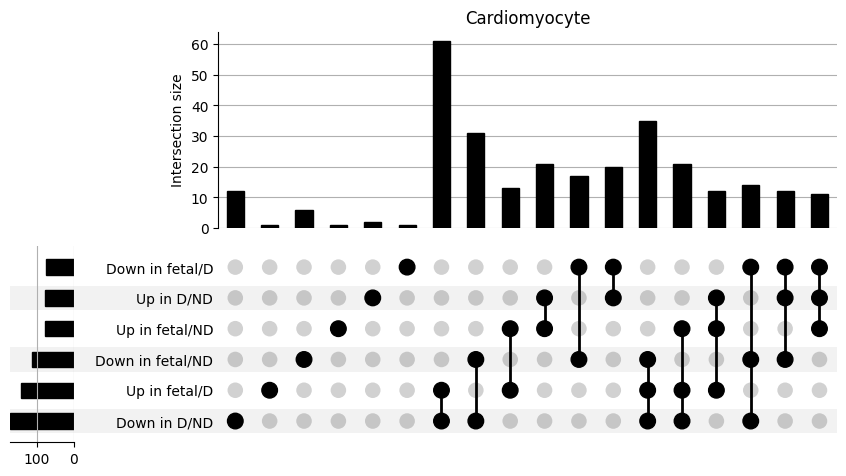

/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


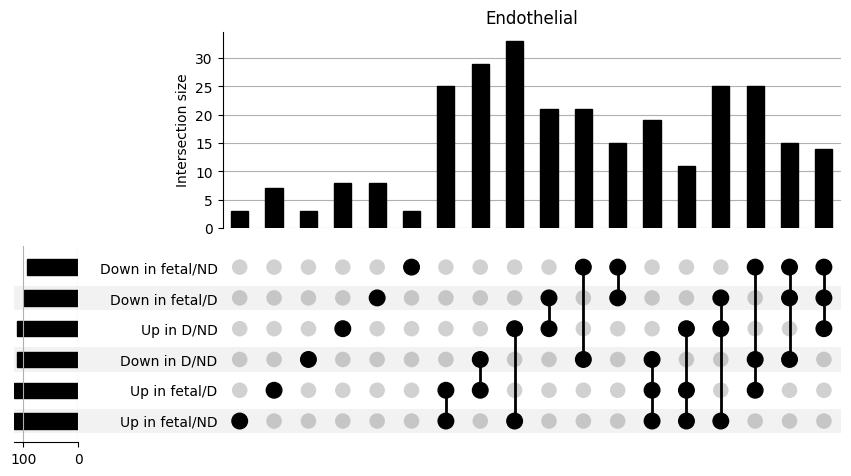

/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


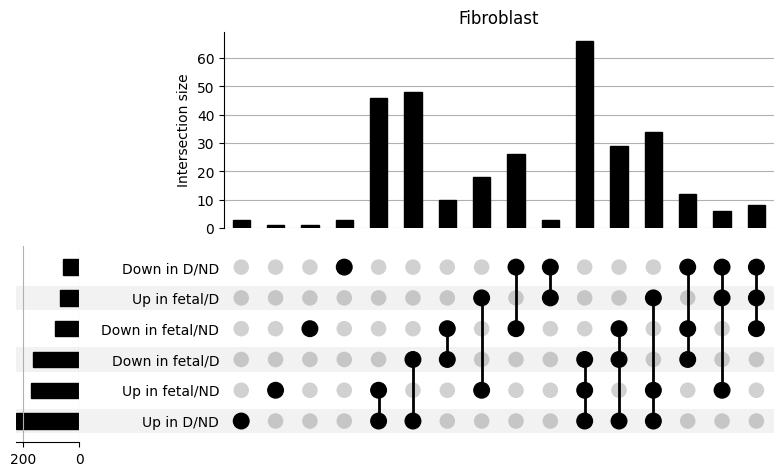

/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


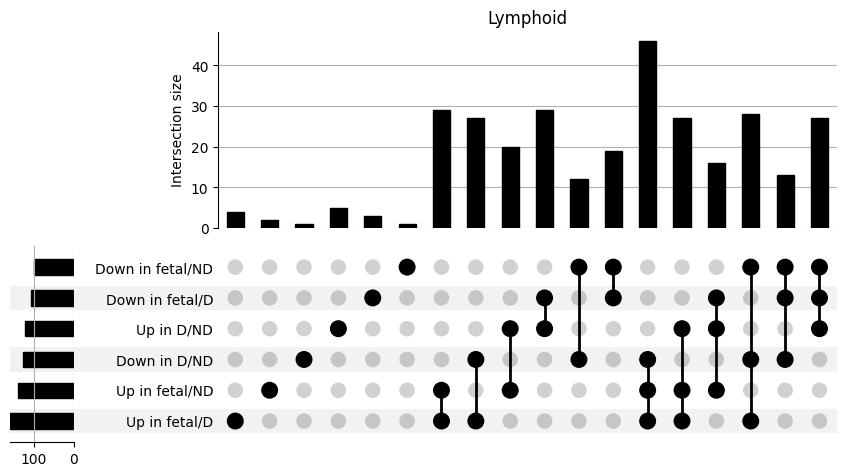

/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


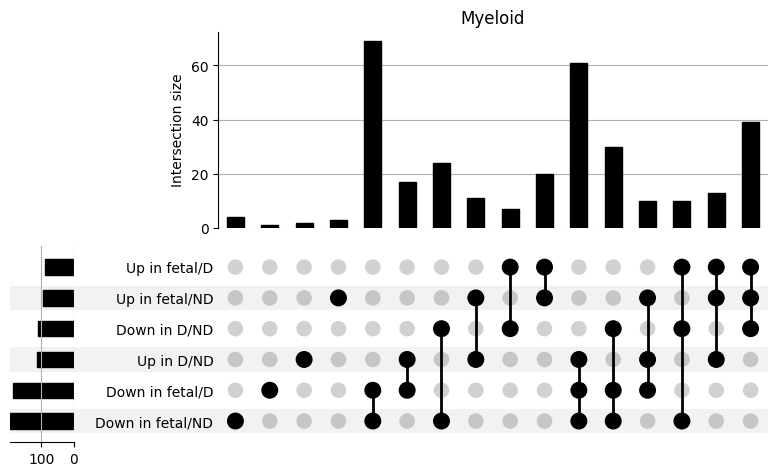

/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


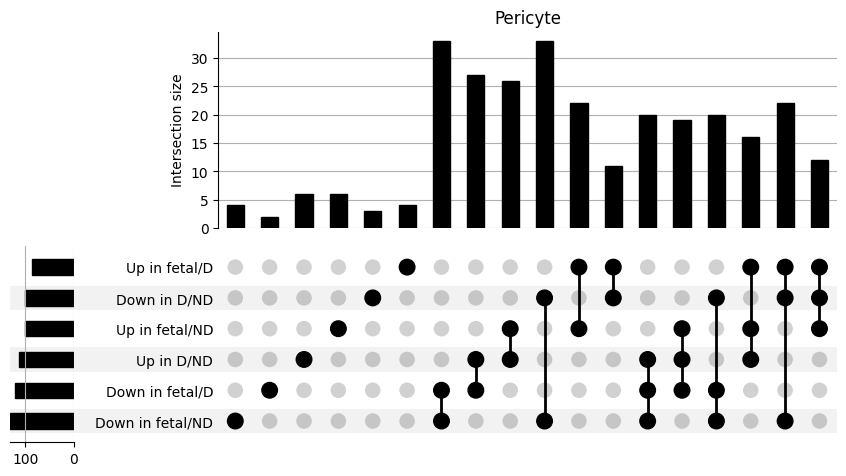

In [33]:
for cell_type in cell_types:
    fold_change_dfs = identify_most_differential_TFs_by_disease(eRegulon_gene_AUC_df, cell_type=cell_type)
    contrast_titles = ['fetal/ND', 'D/ND', 'fetal/D']
    create_upset_plot_from_function_output(cell_type, fold_change_dfs, contrast_titles, fc_thresholds = (1.2, 0.8))

### Create a dataframe with these results

In [34]:
FC_df_list = list()

for cell_type in cell_types:
    print(cell_type)
    top_fetal, top_disease, top_fetal_v_disease = identify_most_differential_TFs_by_disease(eRegulon_gene_AUC_df, cell_type)
    
    fold_change_cell_type = pd.concat([top_fetal, top_disease, top_fetal_v_disease]).reset_index()
    fold_change_cell_type = fold_change_cell_type.rename(columns = {0: "FC"})
    fold_change_cell_type['cell_type'] = cell_type
    fold_change_cell_type['FC_diff'] = fold_change_cell_type['FC'] - 1
    FC_df_list.append(fold_change_cell_type)

FC_df_list_df = pd.concat(FC_df_list)

FC_df_list_df.head()

Cardiomyocyte
Endothelial
Fibroblast
Lymphoid
Myeloid
Pericyte


,index,FC,contrast,cell_type,FC_diff
0,ATF2_direct_+/-_(18g),0.093055,fetal/ND,Cardiomyocyte,-0.906945
1,PRDM16_extended_-/+_(10g),0.123129,fetal/ND,Cardiomyocyte,-0.876871
2,SMARCC1_direct_+/+_(12g),0.124204,fetal/ND,Cardiomyocyte,-0.875796
3,MECP2_direct_+/+_(18g),0.134663,fetal/ND,Cardiomyocyte,-0.865337
4,KLF9_direct_+/+_(11g),0.138605,fetal/ND,Cardiomyocyte,-0.861395


### Filter this df to those in which the disease + fetal is up (2x activity relative to ND)

In [35]:
fetal_and_disease_up_list = list()

for cell_type in cell_types:
    cell_type_df = FC_df_list_df[FC_df_list_df['cell_type'] == cell_type]
    fetal_up_df = cell_type_df[(cell_type_df['FC'] > 2) & (cell_type_df['contrast']  == "fetal/ND")]
    disease_up_df = cell_type_df[(cell_type_df['FC'] > 2) & (cell_type_df['contrast']  == "D/ND")]
    intersecting_genes = set(fetal_up_df['index']) & set(disease_up_df['index'])
    filtered_cell_type_df = cell_type_df[cell_type_df['index'].isin(intersecting_genes)]
    fetal_and_disease_up_list.append(filtered_cell_type_df)

fetal_and_disease_up_df = pd.concat(fetal_and_disease_up_list).reset_index(drop=True)
fetal_and_disease_up_df.to_csv("04_fetal_disease_up_TFs.csv")

### Filter this df to those in which disease + fetal is down (0.5 activity relative to ND)

In [36]:
fetal_and_disease_down_list = list()

for cell_type in cell_types:
    cell_type_df = FC_df_list_df[FC_df_list_df['cell_type'] == cell_type]
    fetal_down_df = cell_type_df[(cell_type_df['FC'] < 0.5) & (cell_type_df['contrast']  == "fetal/ND")]
    disease_down_df = cell_type_df[(cell_type_df['FC'] < 0.5) & (cell_type_df['contrast']  == "D/ND")]
    intersecting_genes = set(fetal_down_df['index']) & set(disease_down_df['index'])
    filtered_cell_type_df = cell_type_df[cell_type_df['index'].isin(intersecting_genes)]
    fetal_and_disease_down_list.append(filtered_cell_type_df)

fetal_and_disease_down_df = pd.concat(fetal_and_disease_down_list).reset_index(drop=True)
fetal_and_disease_up_df.to_csv("04_fetal_disease_down_TFs.csv")

### Combine these together

In [38]:
combined_fetal_and_D_df = pd.concat([fetal_and_disease_up_df, fetal_and_disease_down_df])
combined_fetal_and_D_df.shape

(942, 5)

In [39]:
# keep only the direct regulons
direct_combined_fetal_and_D_df = combined_fetal_and_D_df[combined_fetal_and_D_df['index'].str.contains("direct")]
direct_combined_fetal_and_D_df.to_csv("04_fetal_disease_direct_TFs.csv")
direct_combined_fetal_and_D_df.head()

,index,FC,contrast,cell_type,FC_diff
0,IKZF3_direct_-/+_(13g),2.070727,fetal/ND,Cardiomyocyte,1.070727
1,ZBTB16_direct_-/+_(14g),2.072315,fetal/ND,Cardiomyocyte,1.072315
3,KLF9_direct_-/+_(16g),2.325993,fetal/ND,Cardiomyocyte,1.325993
4,ZFX_direct_+/-_(22g),2.336580,fetal/ND,Cardiomyocyte,1.336580
5,GATAD1_direct_+/-_(15g),2.442420,fetal/ND,Cardiomyocyte,1.442420


In [40]:
# keep only the direct regulons
direct_combined_fetal_and_D_df = combined_fetal_and_D_df[combined_fetal_and_D_df['index'].str.contains("direct")]
direct_combined_fetal_and_D_df.to_csv("04_fetal_disease_direct_TFs.csv")
direct_combined_fetal_and_D_df.head()

,index,FC,contrast,cell_type,FC_diff
0,IKZF3_direct_-/+_(13g),2.070727,fetal/ND,Cardiomyocyte,1.070727
1,ZBTB16_direct_-/+_(14g),2.072315,fetal/ND,Cardiomyocyte,1.072315
3,KLF9_direct_-/+_(16g),2.325993,fetal/ND,Cardiomyocyte,1.325993
4,ZFX_direct_+/-_(22g),2.336580,fetal/ND,Cardiomyocyte,1.336580
5,GATAD1_direct_+/-_(15g),2.442420,fetal/ND,Cardiomyocyte,1.442420


In [41]:
# keep only the indirect regulons
direct_combined_fetal_and_D_df = combined_fetal_and_D_df[combined_fetal_and_D_df['index'].str.contains("indirect")]
direct_combined_fetal_and_D_df.to_csv("04_fetal_disease_indirect_TFs.csv")
direct_combined_fetal_and_D_df.head()

,index,FC,contrast,cell_type,FC_diff


### Plot regulons

/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


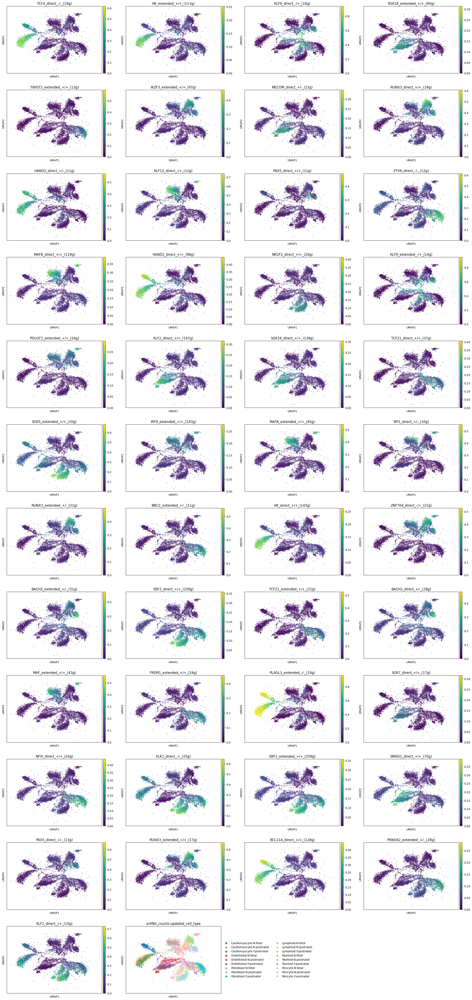

In [42]:
color_list = list(set([x for xs in [rss.loc[ct].sort_values(ascending = False)[0:4].index for ct in rss.index] for x in xs ]))
color_list.append("scRNA_counts:updated_cell_type")
color_list

# this convoluted list comprehension selects the top 3 eRegulons per cell type
sc.pl.umap(eRegulon_gene_AUC, color = color_list)

### Heatmap dotplot

We can draw a heatmap where the color represent target gene enrichment and the dotsize target region enrichment.

In [43]:
from scenicplus.plotting.dotplot import heatmap_dotplot

In [44]:
heatmap_dotplot(
    scplus_mudata = scplus_mdata,
    color_modality = "direct_gene_based_AUC",
    size_modality = "direct_region_based_AUC",
    group_variable = "scRNA_counts:updated_cell_type",
    eRegulon_metadata_key = "direct_e_regulon_metadata",
    color_feature_key = "Gene_signature_name",
    size_feature_key = "Region_signature_name",
    feature_name_key = "eRegulon_name",
    sort_data_by = "direct_gene_based_AUC",
    orientation = "horizontal",
    figsize = (20, 20),
    save = "scenicplus_heatmap.pdf"
)

/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 20 x 20 in image.
/home/william/anaconda3/envs/scenicplus/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: scenicplus_heatmap.pdf


### Produce heatmap

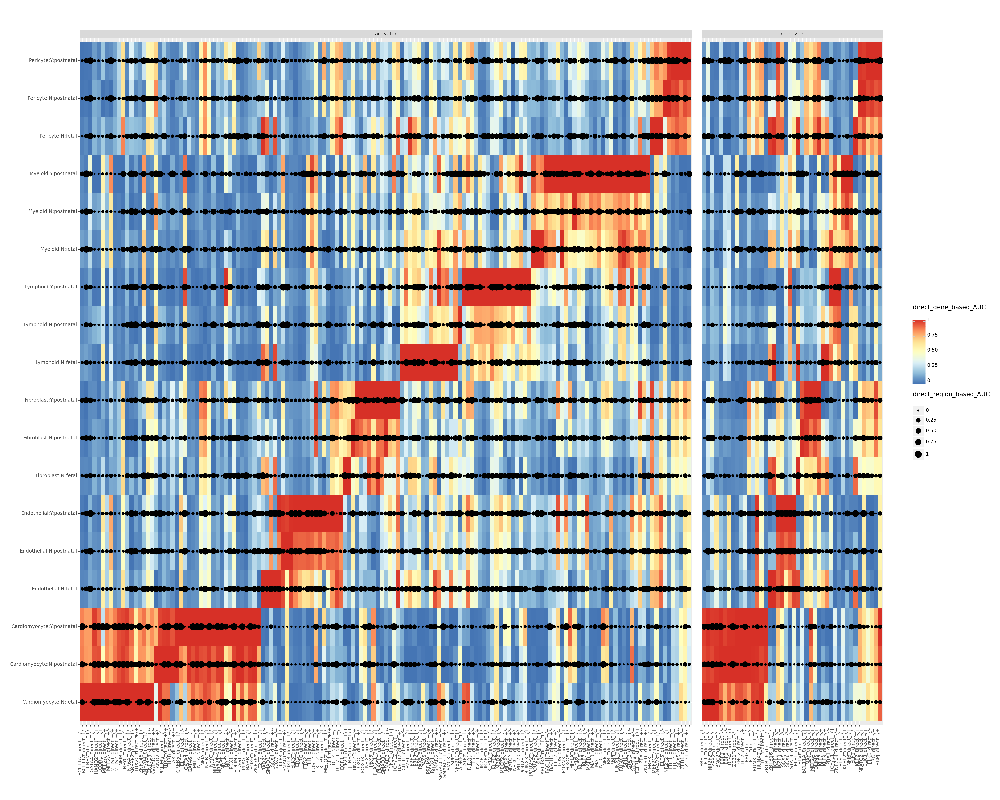

<Figure Size: (2500 x 2000)>

In [45]:
heatmap_dotplot(
    scplus_mudata = scplus_mdata,
    color_modality = "direct_gene_based_AUC",
    size_modality = "direct_region_based_AUC",
    group_variable = "scRNA_counts:updated_cell_type",
    eRegulon_metadata_key = "direct_e_regulon_metadata",
    color_feature_key = "Gene_signature_name",
    size_feature_key = "Region_signature_name",
    feature_name_key = "eRegulon_name",
    sort_data_by = "direct_gene_based_AUC",
    orientation = "horizontal",
    figsize = (25, 20)
)

### Create old style SCENICplus object for other analyses

In [46]:
from scenicplus.scenicplus_class import mudata_to_scenicplus

In [47]:
scplus_obj = mudata_to_scenicplus(
    mdata = scplus_mdata,
    path_to_cistarget_h5 = "scplus_pipeline/Snakemake/ctx_results.hdf5",
    path_to_dem_h5 = "scplus_pipeline/Snakemake/dem_results.hdf5"
)

In [48]:
with open("old_style_scplus_obj.pkl", "wb") as f:
    pickle.dump(scplus_obj, f)